In [1]:
# Install packages
!pip install torch torchaudio transformers datasets librosa matplotlib seaborn soundfile IPython jiwer torchcodec

print("\n<<< INSTALLED MODULES >>> ✅")


<<< INSTALLED MODULES >>> ✅


In [2]:
# Install libraries
import soundfile as sf
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datasets import load_dataset, Audio
import random
import torch
import torchcodec
import IPython.display as ipd
import transformers
import librosa
from jiwer import wer
import string
from transformers import AutoProcessor, AutoModelForCTC, AutoModelForSpeechSeq2Seq, Wav2Vec2Processor, Wav2Vec2ForCTC

print("\n<<< LIBRARIES INSTALLED >>> ✅")


<<< LIBRARIES INSTALLED >>> ✅


In [3]:
# Check for GPU
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cuda


In [4]:
# Load the dataset
from datasets import load_dataset
try:
    ds = load_dataset("facebook/multilingual_librispeech", "spanish", split="test")
    print(f"\n<<< DATASET LOADED WITH {len(ds)} SAMPLES >>>")
except Exception as e:
    print(f"\n<<< FAILED TO LOAD DATASET: {e} >>>")

Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

Using the latest cached version of the dataset since facebook/multilingual_librispeech couldn't be found on the Hugging Face Hub
Found the latest cached dataset configuration 'spanish' at /root/.cache/huggingface/datasets/facebook___multilingual_librispeech/spanish/0.0.0/2e83e61823b4c47dcbcb1980bb88601274127609 (last modified on Sun Dec 14 22:06:40 2025).



<<< DATASET LOADED WITH 2385 SAMPLES >>>


In [5]:
# Prepare the dataset
processed_samples = []
target_count = 10
max_seconds = 15

print("<<< PROCESSING AUDIO SAMPLES >>>")

# Iterate through the dataset
for i, sample in enumerate(ds):
    if len(processed_samples) >= target_count:
        break

    # Extract audio data
    audio_data = sample['audio']
    original_array = audio_data['array']
    sampling_rate = audio_data['sampling_rate']

    # 3. Calculate cutoff point (Duration * Frequency)
    # limit_index = 15 * 16000 (usually)
    limit_index = int(max_seconds * sampling_rate)

    # 4. Truncate the numpy array
    # If the file is shorter than 15s, this slice keeps the original length
    truncated_array = original_array[:limit_index]

    # Create a new dictionary for the processed sample
    processed_sample = {
        'audio': {'array': truncated_array, 'sampling_rate': sampling_rate},
        'text': sample['transcript'] # Corrected from sample['text'] to sample['transcript']
    }

    processed_samples.append(processed_sample)

    # Print details to verify
    duration = len(truncated_array) / sampling_rate
    print(f"Sample {i+1}: Text: '{sample['transcript'][:30]}...' | New Duration: {duration:.2f}s") # Corrected print statement

<<< PROCESSING AUDIO SAMPLES >>>
Sample 1: Text: 'y las almas buscando algún ali...' | New Duration: 15.00s
Sample 2: Text: 'cuando calla el dolor se oye a...' | New Duration: 15.00s
Sample 3: Text: 'echar fuera la vida y acallar ...' | New Duration: 15.00s
Sample 4: Text: 'el vivir con el hombre pobre b...' | New Duration: 15.00s
Sample 5: Text: 'no sabe lo que busca y tú para...' | New Duration: 15.00s
Sample 6: Text: 'como todas las penas aunque ta...' | New Duration: 14.96s
Sample 7: Text: 'pero allí no tendremos en torn...' | New Duration: 14.71s
Sample 8: Text: 'tú has muerto en mansedumbre t...' | New Duration: 10.49s
Sample 9: Text: 'el que gime junto a la tumba d...' | New Duration: 13.51s
Sample 10: Text: 'allá en el otro mundo tu alma ...' | New Duration: 15.00s


In [6]:
# Play audio samples
print("<<< PLAYING PROCESSED AUDIO SAMPLES >>>")
for i, sample in enumerate(processed_samples):
    print(f"\n--- Sample {i+1} ---")
    print(f"Transcript: {sample['text']}")
    ipd.display(ipd.Audio(data=sample['audio']['array'], rate=sample['audio']['sampling_rate']))

<<< PLAYING PROCESSED AUDIO SAMPLES >>>

--- Sample 1 ---
Transcript: y las almas buscando algún alivio se revuelven ansiosas y hacen el mundo que así resulta ser del dolor obra el dolor o la nada quien tenga corazón venga y escoja



--- Sample 2 ---
Transcript: cuando calla el dolor se oye a la muerte las alas tenebrosas batir en los profundos cual si fuesen las olas del mar de la ilusión en que los seres sin rumbo bogan donde se mecen frágiles barquillas las fugitivas formas



--- Sample 3 ---
Transcript: echar fuera la vida y acallar las domésticas cuestiones con el huero fragor de las políticas no hagas caso á los hombres que se juntan y gritan hojas sus gritos son que el viento lleva mientras en silencio su dolor radica



--- Sample 4 ---
Transcript: el vivir con el hombre pobre bestia te ha dado acaso un anhelar oscuro que el lobo no conoce tal vez cuando acostabas la cabeza en mi regazo vagamente soñabas en ser hombre después de muerto ser hombre pobre bestia



--- Sample 5 ---
Transcript: no sabe lo que busca y tú para él mi alma sólo tienes esta palabra nunca a dar voces vacías pobrecillos se juntan y gritan y más gritan y sus penas ocultan y piden no sé que ni ellos saben aunque crean saberlo en su locura



--- Sample 6 ---
Transcript: como todas las penas aunque tantas son una sola pena una sola infinita soberana la pena de vivir llevando al todo temblando ante la nada



--- Sample 7 ---
Transcript: pero allí no tendremos en torno de nuestra alma las almas de las cosas de que vive el alma de los campos las almas de las rocas las almas de los árboles y ríos las de las bestias



--- Sample 8 ---
Transcript: tú has muerto en mansedumbre tú con dulzura entregándote á mí en la suprema sumisión de la vida pero él



--- Sample 9 ---
Transcript: el que gime junto a la tumba de su dios de su amo ni morir sabe tú al morir presentías vagamente vivir en mi memoria no morirte del todo



--- Sample 10 ---
Transcript: allá en el otro mundo tu alma pobre perro no habrá de recostar en mi regazo espiritual su espiritual cabeza la lengua de tu alma pobre amigo no lamerá la mano de mi alma


In [7]:
# Load the model
whisper_model_id = "openai/whisper-small"
whisper_processor = AutoProcessor.from_pretrained(whisper_model_id)

# attn_implementation="eager" is required to output attentions later
whisper_model = AutoModelForSpeechSeq2Seq.from_pretrained(whisper_model_id, attn_implementation="eager")
whisper_model.to(device)

print(f"\n<<< {whisper_model_id} LOADED SUCCESSFULLY >>> ✅")

preprocessor_config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

normalizer.json: 0.00B [00:00, ?B/s]

added_tokens.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/967M [00:00<?, ?B/s]

generation_config.json: 0.00B [00:00, ?B/s]


<<< openai/whisper-small LOADED SUCCESSFULLY >>> ✅


<<< GENERATING TRANSCRIPTIONS AND EXTRACTING ATTENTIONS WITH WHISPER >>>

--- Sample 1 ---
Transcription:  Y las almas, buscando algún alivio, se revuelven ansioses y hacen el mundo, que así resulta ser del dolor obra. El dolor o la nada, quien tenga corazón, venga y escala.

--- Sample 2 ---
Transcription:  Cuando calla el dolor, se oye a la muerte las alas tenebrosas batir en los profundos, cual si fuesen las olas del mar de la ilusión en que los seres sin rumbo bogan, donde se mesen,

--- Sample 3 ---
Transcription:  echar fuera la vida y acallar las domésticas cuestiones con el huero fragor de las políticas. Nueva caso a los hombres que se juntan y gritan. Ojas sus gritos son, que el viento lleva mientras se

--- Sample 4 ---
Transcription:  El vivir con el hombre, pobre bestia, te ha dado a casa un anhelar oscuro que el lobo no conoce. Tal vez, cuando acostabas la cabeza en mi regazo vagamente soñabas en ser hombre después de muerto.

--- Sample 5 ---
Transcription:  No sabe lo qu

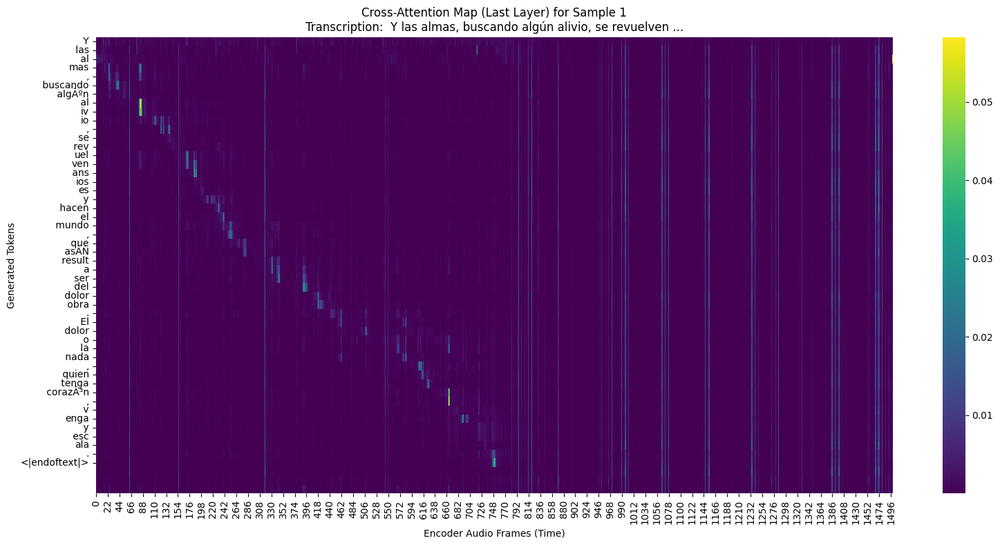


--- Visualizing Sample 2 ---


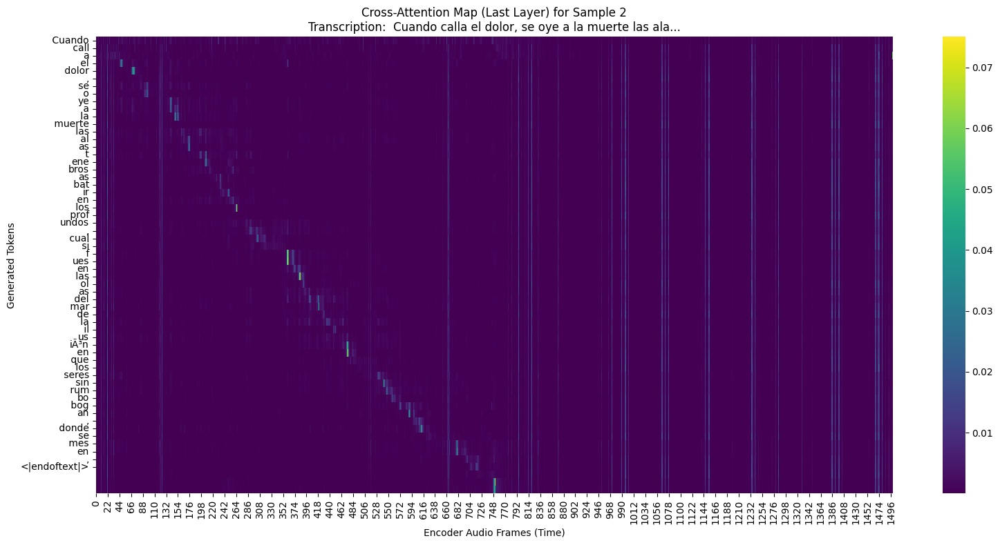


--- Visualizing Sample 3 ---


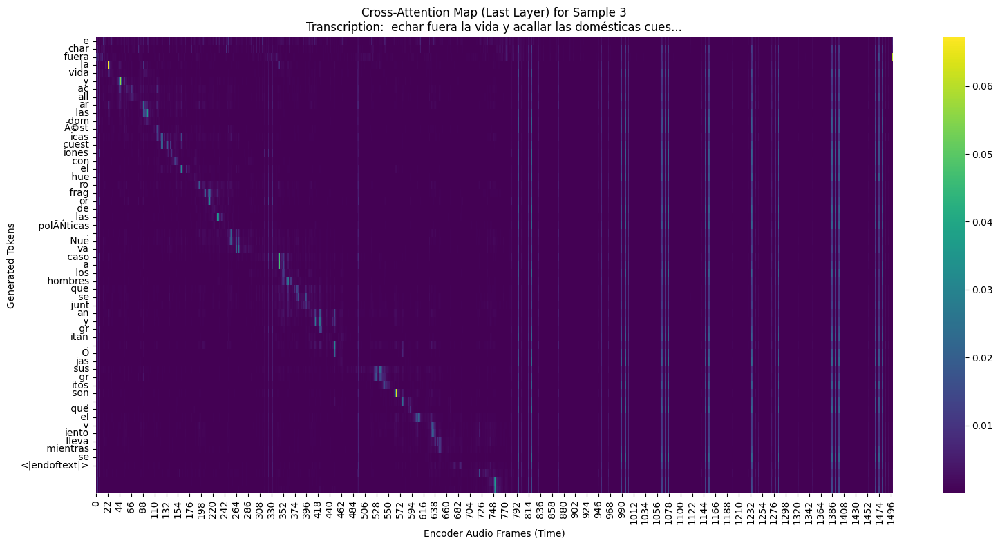


--- Visualizing Sample 4 ---


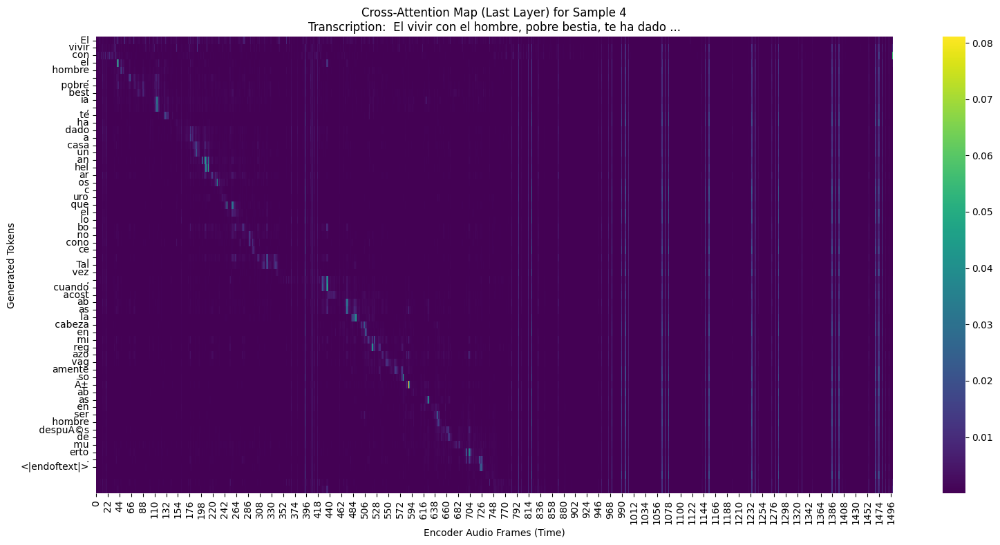


--- Visualizing Sample 5 ---


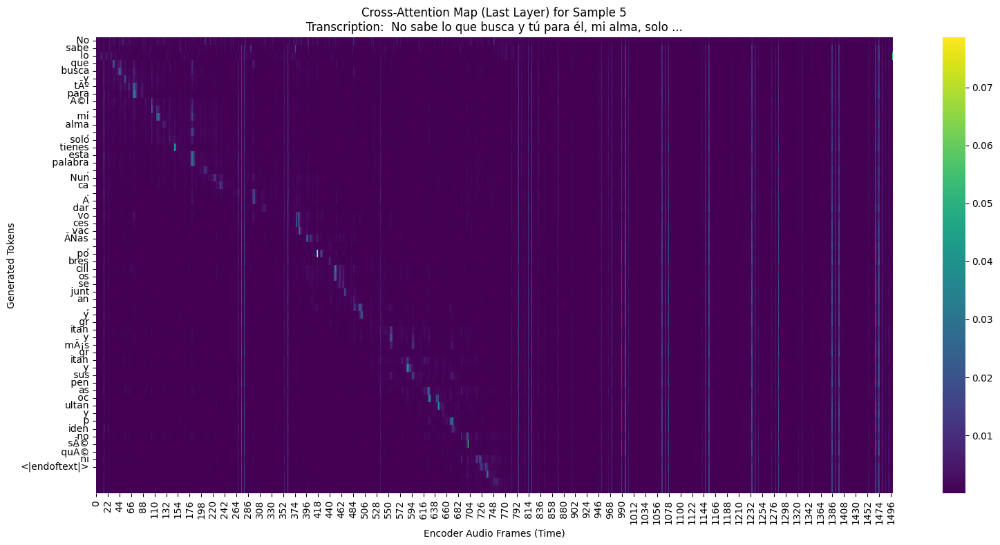


--- Visualizing Sample 6 ---


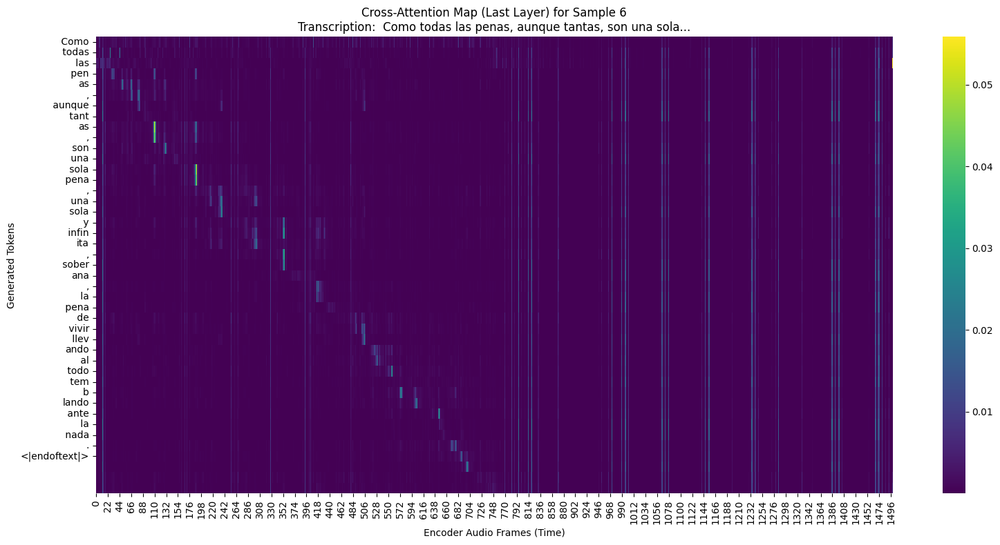


--- Visualizing Sample 7 ---


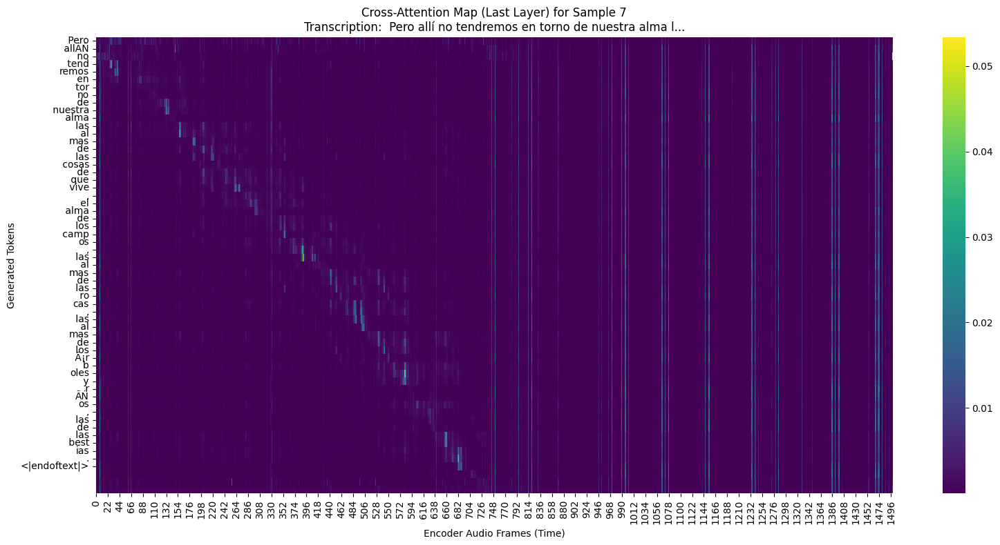


--- Visualizing Sample 8 ---


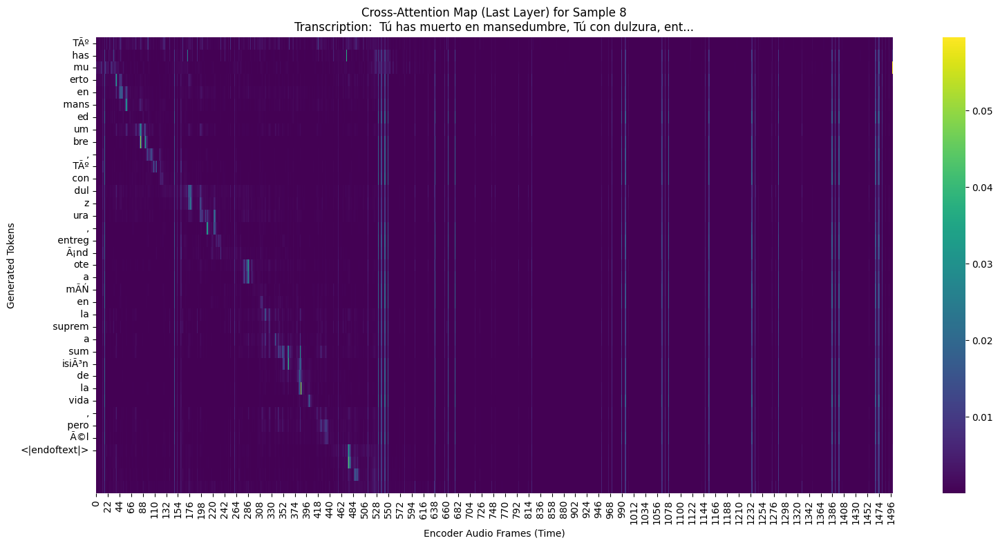


--- Visualizing Sample 9 ---


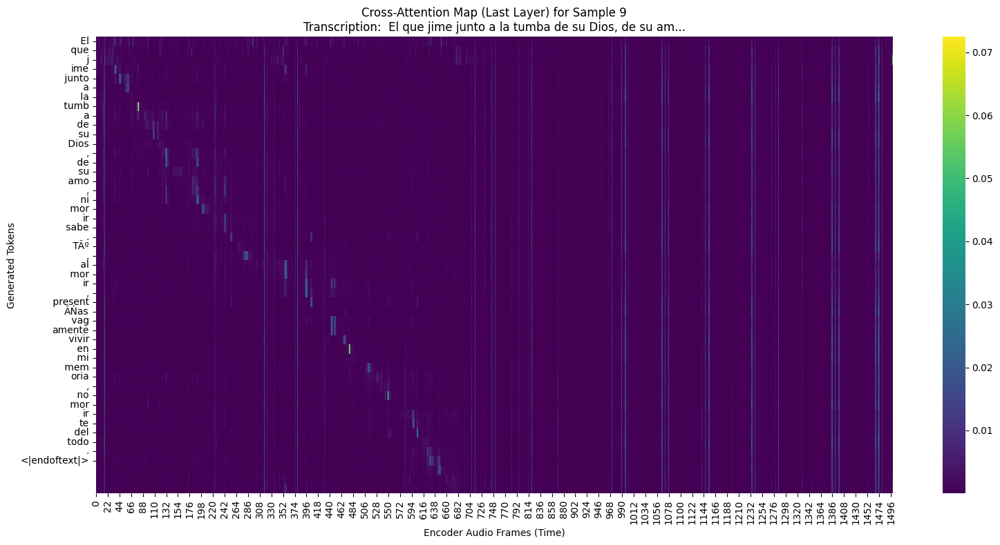


--- Visualizing Sample 10 ---


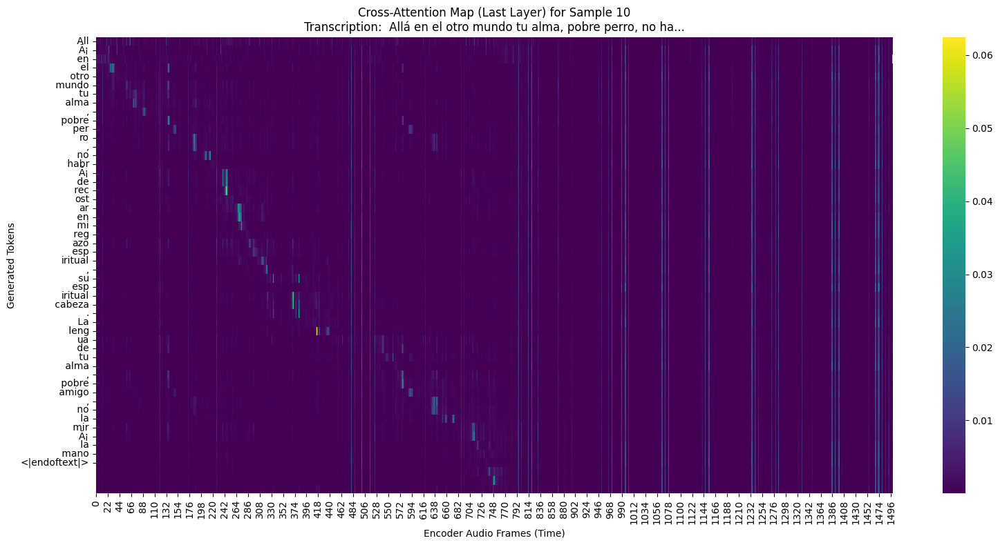

In [8]:
# Evaluate the model
# Suppress transformer warnings to avoid false failure detection
transformers.logging.set_verbosity_error()

print("<<< GENERATING TRANSCRIPTIONS AND EXTRACTING ATTENTIONS WITH WHISPER >>>")

whisper_results = []
target_sampling_rate = 16000

for i, sample in enumerate(processed_samples):
    original_audio_array = sample['audio']['array']
    original_sampling_rate = sample['audio']['sampling_rate']

    # Resample to 16kHz (model requirement)
    if original_sampling_rate != target_sampling_rate:
        audio_array = librosa.resample(y=original_audio_array, orig_sr=original_sampling_rate, target_sr=target_sampling_rate)
    else:
        audio_array = original_audio_array

    # Feature Extraction
    input_features = whisper_processor(audio_array, sampling_rate=target_sampling_rate, return_tensors="pt").input_features.to(device)

    # Generate transcription with attentions
    with torch.no_grad():
        outputs = whisper_model.generate(
            input_features,
            language="spanish",
            output_attentions=True,
            return_dict_in_generate=True
        )

    # Decode
    transcription = whisper_processor.tokenizer.decode(outputs.sequences[0], skip_special_tokens=True)

    # Extract Cross Attentions
    # cross_attentions is a tuple (one element for each generated token) of tuples (one element for each layer)
    cross_attentions = outputs.cross_attentions

    # Detach and move to CPU to save memory
    cleaned_attentions = []
    if cross_attentions is not None:
        for token_step_attn in cross_attentions:
            layer_attns = []
            for layer_attn in token_step_attn:
                layer_attns.append(layer_attn.detach().cpu())
            cleaned_attentions.append(tuple(layer_attns))

    result = {
        'sample_index': i + 1,
        'transcription': transcription,
        'generated_token_ids': outputs.sequences[0].detach().cpu().tolist(),
        'cross_attentions': tuple(cleaned_attentions)
    }
    whisper_results.append(result)

    print(f"\n--- Sample {i+1} ---")
    print(f"Transcription: {transcription}")

print("\n<<< WHISPER PROCESSING COMPLETE >>>")

# Restore default warning level
transformers.logging.set_verbosity_warning()

print("\n<<< VISUALIZING WHISPER ATTENTION WEIGHTS >>>")

for i, result in enumerate(whisper_results):
    print(f"\n--- Visualizing Sample {result['sample_index']} ---")

    # Get attentions: tuple(steps) of tuple(layers)
    # Each tensor in the tuple has shape: (batch_size, num_heads, sequence_length=1, encoder_sequence_length)
    cross_attns = result['cross_attentions']

    if not cross_attns:
        print("No attention weights found.")
        continue

    # Select the last decoder layer for visualization (usually captures the most semantic alignment)
    # step[-1] gets the tensor for the last layer at a specific generation step
    last_layer_attns = [step[-1] for step in cross_attns]

    # Concatenate along the sequence length dimension (dim 2) to form the full attention matrix for the sequence
    # Resulting shape: (batch_size, num_heads, num_tokens, encoder_sequence_length)
    full_attn = torch.cat(last_layer_attns, dim=2)

    # Average over heads (dim 1) to get a simplified view
    # Resulting shape: (batch_size, num_tokens, encoder_sequence_length)
    avg_attn = full_attn.mean(dim=1)

    # Squeeze the batch dimension (we have batch_size=1)
    # Resulting shape: (num_tokens, encoder_sequence_length)
    attn_matrix = avg_attn.squeeze(0).numpy()

    # Prepare Y-axis labels (Generated Tokens)
    # The cross_attentions correspond to the generation steps.
    # We align the last N tokens from the generated_token_ids with the N steps in cross_attentions.
    all_ids = result['generated_token_ids']
    num_generated = len(cross_attns)
    relevant_ids = all_ids[-num_generated:]

    # Convert Token IDs to readable strings
    token_labels = whisper_processor.tokenizer.convert_ids_to_tokens(relevant_ids)
    # Clean up special characters for better readability (Whisper uses Ġ for space)
    token_labels = [t.replace('Ġ', ' ') for t in token_labels]

    # Plot Heatmap
    plt.figure(figsize=(16, 8))
    sns.heatmap(attn_matrix, cmap='viridis', yticklabels=token_labels)
    plt.title(f"Cross-Attention Map (Last Layer) for Sample {result['sample_index']}\nTranscription: {result['transcription'][:50]}...")
    plt.xlabel("Encoder Audio Frames (Time)")
    plt.ylabel("Generated Tokens")
    plt.tight_layout()
    plt.show()